### Import & Load Packages

In [1]:
%pip install -q yellowbrick

Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install -q kaggle

Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd
from datetime import datetime

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import KElbowVisualizer

import warnings
warnings.filterwarnings('ignore')

from matplotlib import rcParams
rcParams['font.family'] = 'DejaVu Sans'

In [ ]:
# !mkdir ~/.kaggle
# !cp kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d "shivamb/bank-customer-segmentation"

Dataset URL: https://www.kaggle.com/datasets/shivamb/bank-customer-segmentation
License(s): copyright-authors
 91% 22.0M/24.2M [00:01<00:00, 26.7MB/s]
100% 24.2M/24.2M [00:01<00:00, 15.5MB/s]


In [ ]:
#!/bin/bash
!curl -L -o bank-customer-segmentation.zip\
  https://www.kaggle.com/api/v1/datasets/download/shivamb/bank-customer-segmentation

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 24.1M  100 24.1M    0     0  5495k      0  0:00:04  0:00:04 --:--:-- 7363k


In [ ]:
import zipfile

dataset_zip = zipfile.ZipFile("bank-customer-segmentation.zip", "r")
dataset_zip.extractall()
dataset_zip.close()

In [4]:
raw_data = pd.read_csv("bank_transactions.csv")
raw_data.sample(frac = 1).head()

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
799989,T799990,C6333755,1/3/72,M,GUNTUR,404280.68,5/9/16,164824,990.0
146475,T146476,C6815835,27/6/79,F,DAMAN,51919.75,5/8/16,182413,2183.0
535483,T535484,C5034257,15/10/88,F,DELHI,1324.03,22/8/16,91345,45.0
585870,T585871,C3110287,3/8/91,M,DEHRADUN,30721.16,23/8/16,154211,243.0
188057,T188058,C6213555,27/6/78,M,MUMBAI,294370.84,9/8/16,150039,3608.0


In [5]:
raw_data.shape

(1048567, 9)

### Data Inspection

In [6]:
# cek struktur data
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048567 entries, 0 to 1048566
Data columns (total 9 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   TransactionID            1048567 non-null  object 
 1   CustomerID               1048567 non-null  object 
 2   CustomerDOB              1045170 non-null  object 
 3   CustGender               1047467 non-null  object 
 4   CustLocation             1048416 non-null  object 
 5   CustAccountBalance       1046198 non-null  float64
 6   TransactionDate          1048567 non-null  object 
 7   TransactionTime          1048567 non-null  int64  
 8   TransactionAmount (INR)  1048567 non-null  float64
dtypes: float64(2), int64(1), object(6)
memory usage: 72.0+ MB


In [7]:
# cek apakah ada dataset yang hilang
raw_data.isna().sum()

TransactionID                 0
CustomerID                    0
CustomerDOB                3397
CustGender                 1100
CustLocation                151
CustAccountBalance         2369
TransactionDate               0
TransactionTime               0
TransactionAmount (INR)       0
dtype: int64

In [8]:
# cek nilai unik dari tiap kolom

## ekstrak nama kolom dari dataset
nama_kolom = raw_data.columns

## lakukan iterasi untuk mengecek nilai unik dari tiap kolom
for i in nama_kolom:
    unique_values = raw_data[i].unique()
    try:
      print("Nama kolom: {} ({}, {})".format(i, len(unique_values), raw_data[i].dtype))
      print(np.array(sorted(unique_values)))
    except:
      print(unique_values)

Nama kolom: TransactionID (1048567, object)
['T1' 'T10' 'T100' ... 'T999997' 'T999998' 'T999999']
Nama kolom: CustomerID (884265, object)
['C1010011' 'C1010012' 'C1010014' ... 'C9099919' 'C9099941' 'C9099956']
Nama kolom: CustomerDOB (17255, object)
['10/1/94' '4/4/57' '26/11/96' ... '18/7/65' '15/5/42' '24/10/44']
Nama kolom: CustGender (4, object)
['F' 'M' nan 'T']
Nama kolom: CustLocation (9356, object)
['JAMSHEDPUR' 'JHAJJAR' 'MUMBAI' ... 'KARANJIA'
 'NR HERITAGE FRESH HYDERABAD' 'IMPERIA THANE WEST']
Nama kolom: CustAccountBalance (161329, float64)
[0.00000000e+00 1.00000000e-02 3.00000000e-02 ... 6.97993296e+07
 8.22446299e+07 1.15035495e+08]
Nama kolom: TransactionDate (55, object)
['1/8/16' '1/9/16' '10/8/16' '10/9/16' '11/8/16' '11/9/16' '12/8/16'
 '12/9/16' '13/8/16' '13/9/16' '14/8/16' '14/9/16' '15/8/16' '15/9/16'
 '16/10/16' '16/8/16' '17/8/16' '18/8/16' '18/9/16' '19/8/16' '2/8/16'
 '2/9/16' '20/8/16' '21/10/16' '21/8/16' '22/8/16' '22/9/16' '23/8/16'
 '23/9/16' '24/8/16'

# Preprocessing Data

In [9]:
# Drop row(s) with nan value
preprocessed_data = raw_data.dropna()
preprocessed_data.isna().sum()

TransactionID              0
CustomerID                 0
CustomerDOB                0
CustGender                 0
CustLocation               0
CustAccountBalance         0
TransactionDate            0
TransactionTime            0
TransactionAmount (INR)    0
dtype: int64

In [10]:
preprocessed_data.shape

(1041614, 9)

In [11]:
# Drop row(s) with duplicate value
preprocessed_data.drop_duplicates(inplace=True)
preprocessed_data.shape

(1041614, 9)

In [12]:
preprocessed_data.drop(preprocessed_data[preprocessed_data['CustGender']=='T'].index, inplace=True)
preprocessed_data.shape

(1041613, 9)

In [14]:
for data in preprocessed_data["CustomerDOB"].unique():
  date, month, year = data.split("/")
  if int(year) > 100:  # remove more than two digit year
    print(data)
    preprocessed_data = preprocessed_data[preprocessed_data["CustomerDOB"] != data]
preprocessed_data.shape

(985322, 9)

In [15]:
preprocessed_data.drop(columns=['TransactionID'], inplace=True)
preprocessed_data.sample(frac = 1).head()

,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
962404,C8429551,28/9/94,F,DELHI,5520.46,10/9/16,152134,930.0
348842,C2825168,6/2/90,F,WALAJAPET,9318.96,14/8/16,140352,255.0
504229,C1818579,15/2/85,M,PATNA,688444.59,20/8/16,131245,65.0
587850,C1018235,24/3/88,M,NAVI MUMBAI,1832.52,27/8/16,205204,300.0
157289,C4924670,20/5/85,M,PUNE,16912.42,3/9/16,161721,2310.0


In [16]:
%%time
# convert type of columns TransactionDate, CustomerDOB from string to datetime
preprocessed_data['TransactionDate'] = pd.to_datetime(preprocessed_data['TransactionDate'], format='%d/%m/%y', errors='coerce')
preprocessed_data['CustomerDOB'] = pd.to_datetime(preprocessed_data['CustomerDOB'], format='%d/%m/%y', errors='coerce')

# encode 'CustGender' to numeric format (F = 0, M = 1)
preprocessed_data['CustGender'] = preprocessed_data['CustGender'].map({'F': 0, 'M': 1})

# calculate 'CustomerAge' based on 'CustomerDOB'
preprocessed_data['CustomerAge'] = preprocessed_data['TransactionDate'].dt.year - preprocessed_data['CustomerDOB'].dt.year
preprocessed_data = preprocessed_data[preprocessed_data['CustomerAge'] > 0]

np.array(sorted(preprocessed_data['CustomerAge'].unique()))

CPU times: user 822 ms, sys: 3.27 ms, total: 825 ms
Wall time: 828 ms


array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47], dtype=int32)

In [ ]:
# Drop unusual CustomerAge row
# preprocessed_data = preprocessed_data[preprocessed_data["CustomerAge"] >= 17]
# display(np.array(sorted(preprocessed_data['CustomerAge'].unique())), len(preprocessed_data))

# preprocessed_data.sample(frac = 1).head()

In [ ]:
# Converting 'CustLocation' to numeric format using label encoding
# preprocessed_data['CustLocation'] = pd.factorize(preprocessed_data['CustLocation'])[0]

In [17]:
%%time

# Calculate transaction frequency, total, and average per customer
transaction_summary = preprocessed_data.groupby('CustomerID').agg({
    # 'TransactionAmount (INR)': ['count', 'sum', 'mean'],
    'TransactionAmount (INR)': ['count', 'sum'],
    'TransactionDate': ['min', 'max'],
}).reset_index()

# Flatten the MultiIndex columns
transaction_summary.columns = [
    'CustomerID',
    'TransactionCount',
    'TotalAmount',
    # 'AverageAmount',
    'FirstTransactionDate',
    'LastTransactionDate',
]

# No need to calculate Age cause it's already in the dataset
transaction_summary['Age'] = preprocessed_data.groupby('CustomerID')['CustomerAge'].first().values

# Add customer gender
transaction_summary['Gender'] = preprocessed_data.groupby('CustomerID')['CustGender'].first().values

# Add customer account balance
transaction_summary['AccBalance'] = preprocessed_data.groupby('CustomerID')['CustAccountBalance'].first().values

# Add recency (days since last transaction)
transaction_summary['Recency'] = transaction_summary['LastTransactionDate'].apply(
    lambda date: (datetime.now() - pd.to_datetime(date)).days
)

# Group by customer and calculate the date range
transaction_summary['DayRange'] = (transaction_summary['LastTransactionDate'] - transaction_summary['FirstTransactionDate']).dt.days

CPU times: user 4.57 s, sys: 36.6 ms, total: 4.61 s
Wall time: 4.66 s


In [18]:
# Check the results
transaction_summary.head(10)

,CustomerID,TransactionCount,TotalAmount,FirstTransactionDate,LastTransactionDate,Age,Gender,AccBalance,Recency,DayRange
0,C1010011,2,5106.0,2016-08-09,2016-09-26,24,0,32500.73,3004,48
1,C1010012,1,1499.0,2016-08-14,2016-08-14,22,1,24204.49,3047,0
2,C1010014,2,1455.0,2016-08-01,2016-08-07,24,0,38377.14,3054,6
3,C1010018,1,30.0,2016-09-15,2016-09-15,26,0,496.18,3015,0
4,C1010028,1,557.0,2016-08-29,2016-08-29,28,0,296828.37,3032,0
5,C1010031,2,1864.0,2016-08-03,2016-08-04,32,1,1754.10,3057,1
6,C1010035,2,750.0,2016-08-01,2016-08-27,24,1,7284.42,3034,26
7,C1010036,1,208.0,2016-08-26,2016-08-26,20,1,355430.17,3035,0
8,C1010037,1,19680.0,2016-08-09,2016-08-09,35,1,95859.17,3052,0
9,C1010038,1,100.0,2016-09-07,2016-09-07,24,0,1290.76,3023,0


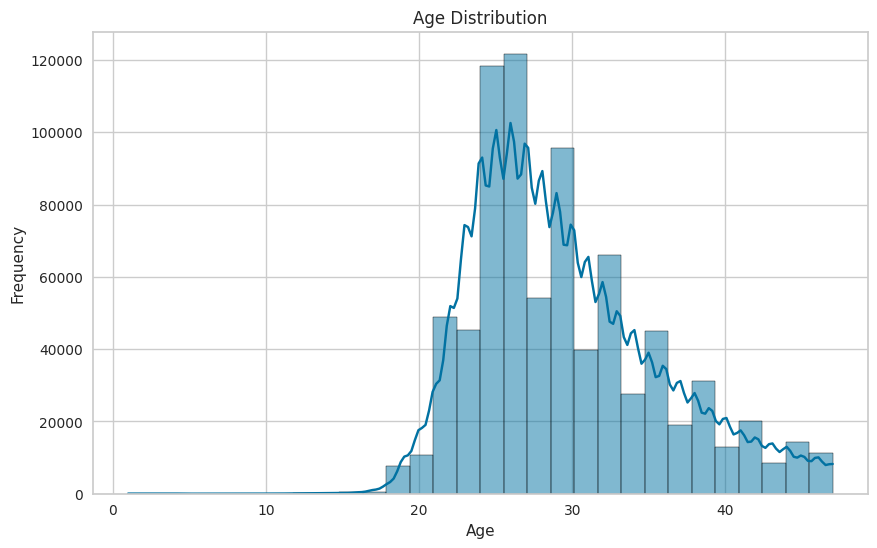

In [19]:
# Visualize Age Distribution
plt.figure(figsize=(10, 6))
sns.histplot(transaction_summary['Age'], bins=30, kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

Text(0, 0.5, 'Count')

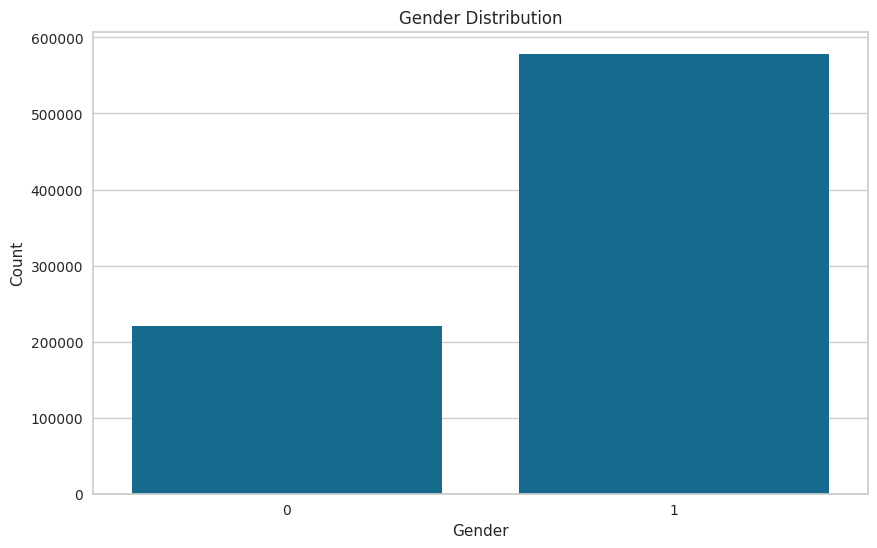

In [20]:
# Visualize Gender Distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='Gender', data=transaction_summary)
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')

Text(0, 0.5, 'TotalAmount')

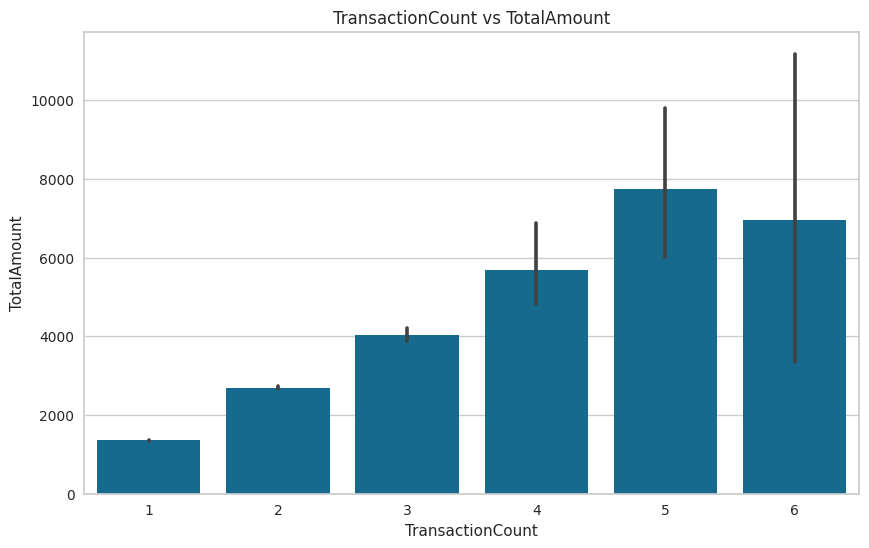

In [21]:
# Visualize TransactionCount vs TotalAmount Distribution
plt.figure(figsize=(10, 6))
sns.barplot(x='TransactionCount', y='TotalAmount', data=transaction_summary)
plt.title('TransactionCount vs TotalAmount')
plt.xlabel('TransactionCount')
plt.ylabel('TotalAmount')

Text(0, 0.5, 'AccBalance')

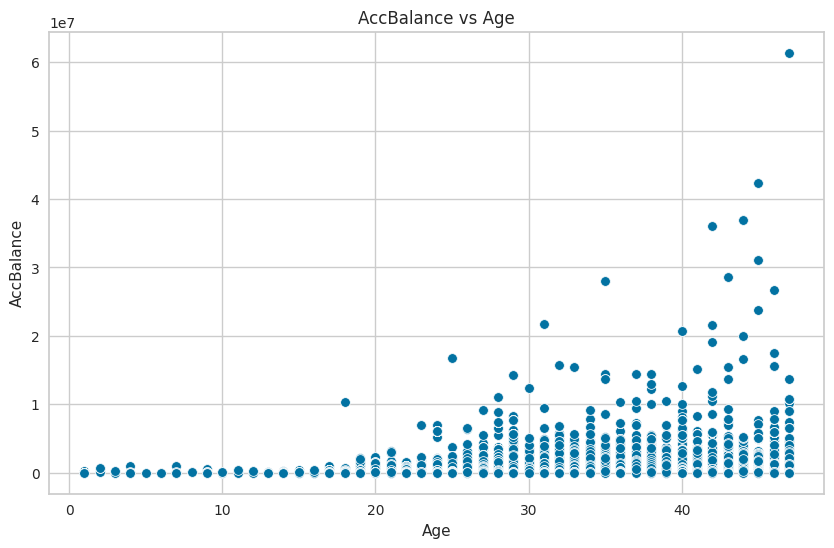

In [22]:
# Visualize AccBallance vs Age Distribution
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='AccBalance', data=transaction_summary)
plt.title('AccBalance vs Age')
plt.xlabel('Age')
plt.ylabel('AccBalance')

Text(0, 0.5, 'AccBalance')

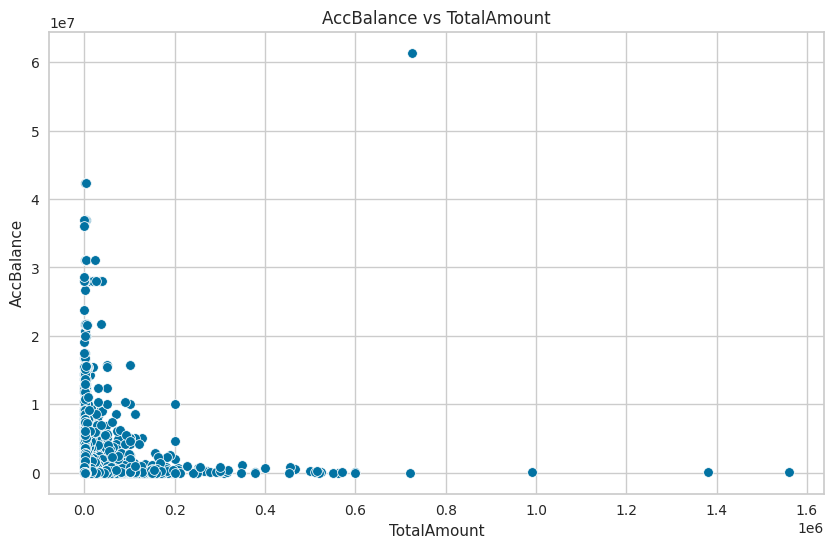

In [23]:
# Visualize AccBalance vs TotalAmount of Transaction
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TotalAmount', y='AccBalance', data=transaction_summary)
plt.title('AccBalance vs TotalAmount')
plt.xlabel('TotalAmount')
plt.ylabel('AccBalance')

In [24]:
# Select features for clustering
columns = [
  'Age',
  # 'Gender',
  # 'DayRange',
  'AccBalance',
  # 'TransactionCount',
  'TotalAmount',
  # 'AverageAmount',
  # 'Recency',
]
features = transaction_summary[columns]
features.sample(frac = 1).head()

,Age,AccBalance,TotalAmount
192101,31,17916.41,100.00
335367,26,207664.26,650.00
650447,27,417874.67,105.34
645831,41,14577.16,2500.00
261756,30,3983.38,255.00


In [25]:
# Process only 3% of data cause lack of resource
features = features.sample(frac = 0.03, random_state = 1000)
features.head()

,Age,AccBalance,TotalAmount
289749,27,46323.42,1000.00
74232,31,25837.93,2550.00
80427,25,14586.30,0.10
540394,46,196643.98,36000.00
519692,28,17552.17,1239.52


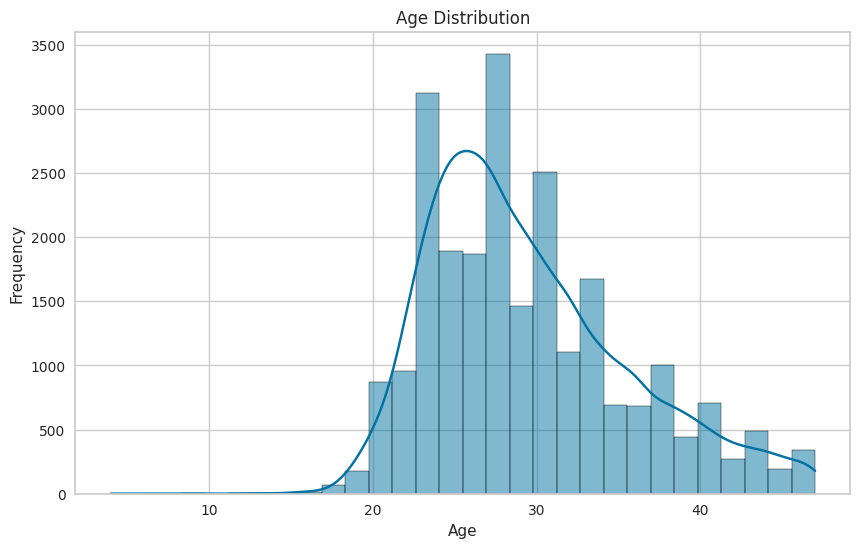

In [26]:
# Visualize Age Distribution
plt.figure(figsize=(10, 6))
sns.histplot(features['Age'], bins=30, kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

Text(0, 0.5, 'AccBalance')

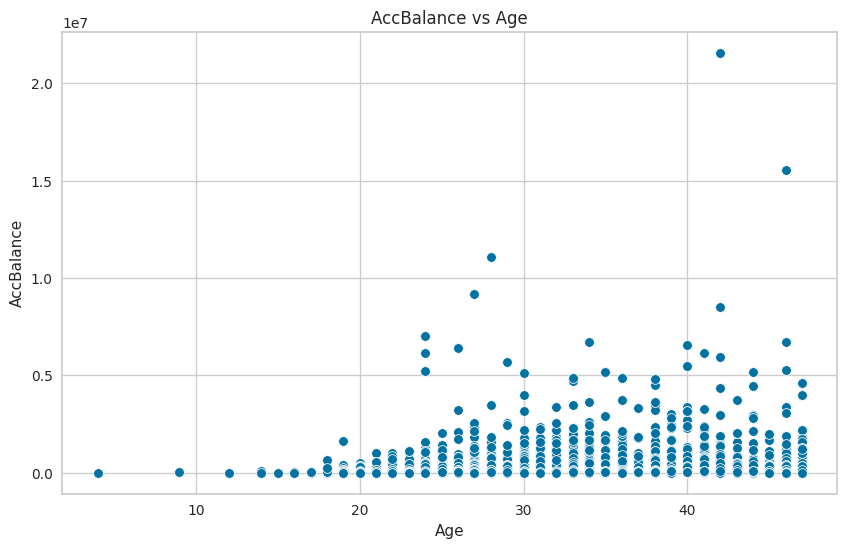

In [27]:
# Visualize AccBallance vs Age Distribution
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='AccBalance', data=features)
plt.title('AccBalance vs Age')
plt.xlabel('Age')
plt.ylabel('AccBalance')

Text(0, 0.5, 'AccBalance')

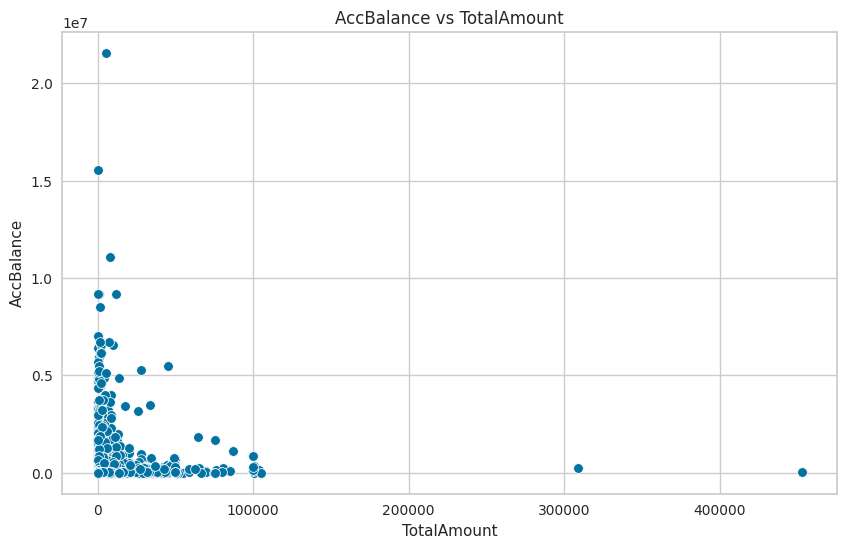

In [28]:
# Visualize AccBalance vs TotalAmount of Transaction
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TotalAmount', y='AccBalance', data=features)
plt.title('AccBalance vs TotalAmount')
plt.xlabel('TotalAmount')
plt.ylabel('AccBalance')

In [29]:
# Scale features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

scaled_features[:5]

array([[-0.4043928 , -0.10130087, -0.09421707],
       [ 0.24694754, -0.15755014,  0.18191021],
       [-0.73006297, -0.18844499, -0.27234588],
       [ 2.68947379,  0.3114509 ,  6.14091496],
       [-0.24155771, -0.18030127, -0.05154739]])

In [30]:
data_length = len(scaled_features)
data_length

23988

### Modelling

In [31]:
%%time

# find the best params combination

eps_range = np.arange(0.5, 3.5, 0.5)  # Example range for eps
min_samples_range = np.arange(10, 30, 5)  # Example range for min_samples

results = []

for eps in eps_range:
  for min_samples in min_samples_range:
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(scaled_features)

    # label cluster
    labels_dbscan = dbscan.labels_

    # menghitung jumlah elemen dari tiap cluster
    print(f"{eps}, {min_samples}; Done, Next", end=" --> ")
    if len(np.unique(labels_dbscan)) > 1:  # Check if more than one cluster is found
      # Remove the 'ignore_index' argument as it's not supported by silhouette_score
      score = silhouette_score(scaled_features, labels_dbscan)
      results.append([eps, min_samples, score, np.unique(labels_dbscan, return_counts=True)])
print("Finish.")

result_df = pd.DataFrame(results, columns=['eps', 'min_samples', 'silhouette_score', 'clusters'])
display(result_df)

0.5, 10; Done, Next --> 0.5, 15; Done, Next --> 0.5, 20; Done, Next --> 0.5, 25; Done, Next --> 1.0, 10; Done, Next --> 1.0, 15; Done, Next --> 1.0, 20; Done, Next --> 1.0, 25; Done, Next --> 1.5, 10; Done, Next --> 1.5, 15; Done, Next --> 1.5, 20; Done, Next --> 1.5, 25; Done, Next --> 2.0, 10; Done, Next --> 2.0, 15; Done, Next --> 2.0, 20; Done, Next --> 2.0, 25; Done, Next --> 2.5, 10; Done, Next --> 2.5, 15; Done, Next --> 2.5, 20; Done, Next --> 2.5, 25; Done, Next --> 3.0, 10; Done, Next --> 3.0, 15; Done, Next --> 3.0, 20; Done, Next --> 3.0, 25; Done, Next --> Finish.


,eps,min_samples,silhouette_score,clusters
0,0.5,10,0.695793,"([-1, 0, 1, 2, 3], [316, 23623, 31, 8, 10])"
1,0.5,15,0.803552,"([-1, 0], [425, 23563])"
2,0.5,20,0.789556,"([-1, 0], [505, 23483])"
3,0.5,25,0.780932,"([-1, 0], [561, 23427])"
4,1.0,10,0.889953,"([-1, 0], [126, 23862])"
5,1.0,15,0.881662,"([-1, 0], [150, 23838])"
6,1.0,20,0.876581,"([-1, 0], [164, 23824])"
7,1.0,25,0.870994,"([-1, 0], [181, 23807])"
8,1.5,10,0.888455,"([-1, 0, 1], [57, 23918, 13])"
9,1.5,15,0.912663,"([-1, 0], [78, 23910])"


CPU times: user 1min 49s, sys: 19.1 s, total: 2min 8s
Wall time: 1min 54s


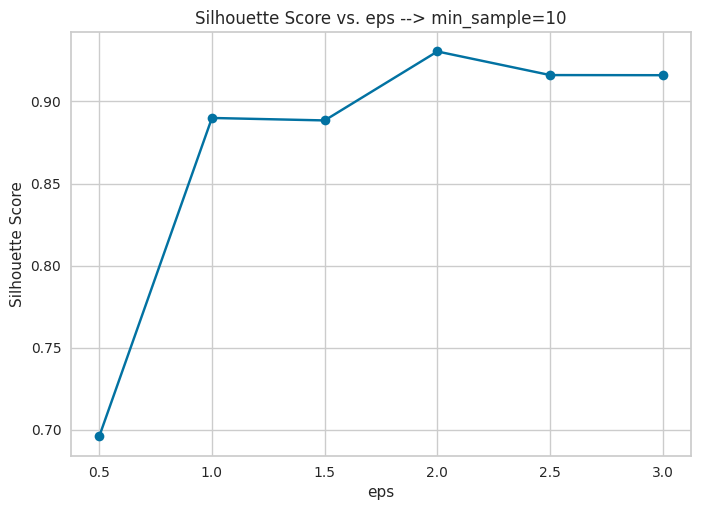

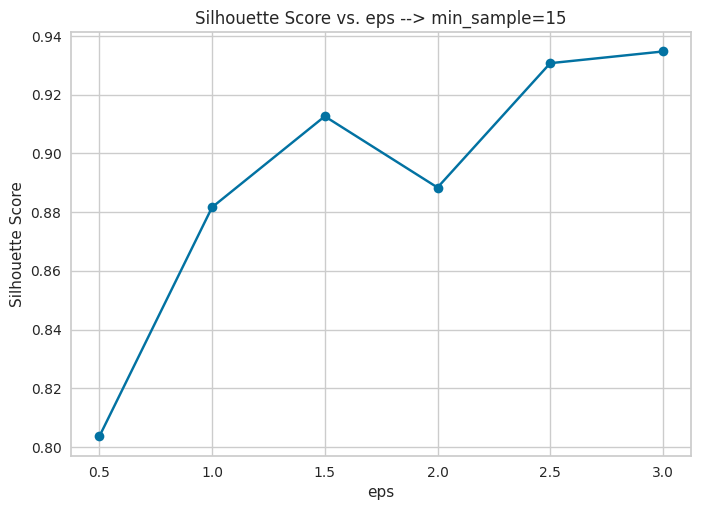

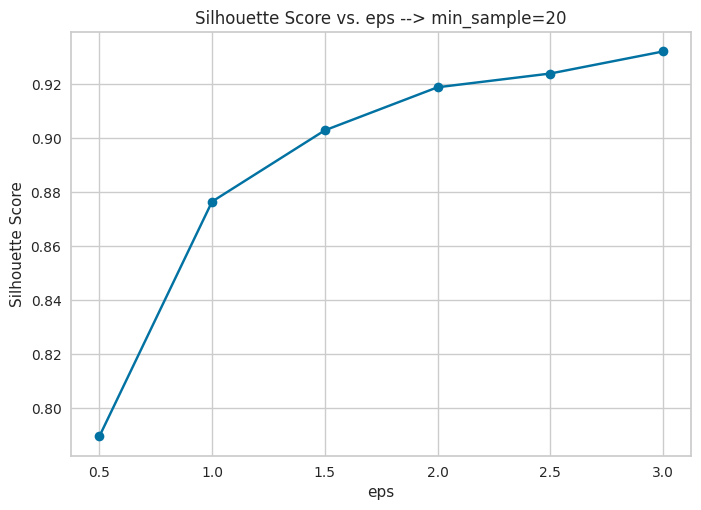

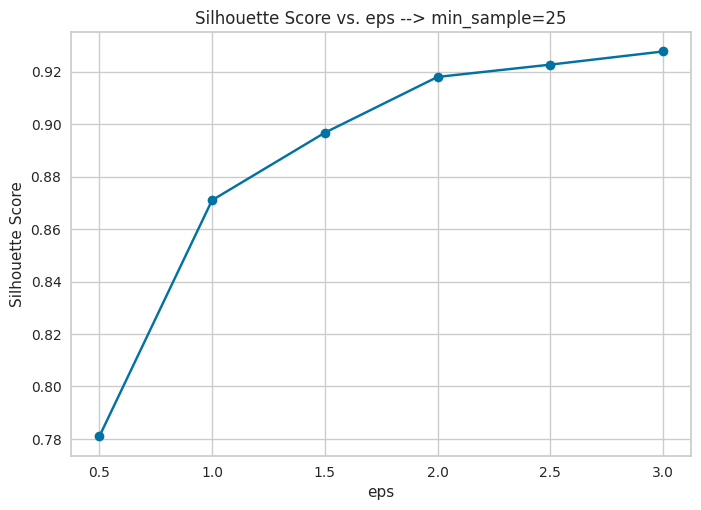

In [32]:
# Instead of KElbowVisualizer, which is primarily for K-means, we will manually iterate through different eps and min_samples values
# and evaluate the silhouette score for each combination.

for min_samples in min_samples_range:
  sample_range = result_df['min_samples'] == min_samples
  # Then plot the results to visually identify the "elbow" point and select the optimal eps and min_samples values.
  plt.title(f'Silhouette Score vs. eps --> min_sample={min_samples}')
  plt.plot(result_df[sample_range]['eps'], result_df[sample_range]['silhouette_score'], marker='o')
  plt.xlabel('eps')
  plt.ylabel('Silhouette Score')
  plt.grid(True)
  plt.show()

Cluster -1: Min=-0.85, Avg=-0.31, Max=0.12
Cluster 0: Min=-0.73, Avg=0.89, Max=0.93
Cluster 1: Min=0.81, Avg=0.87, Max=0.91


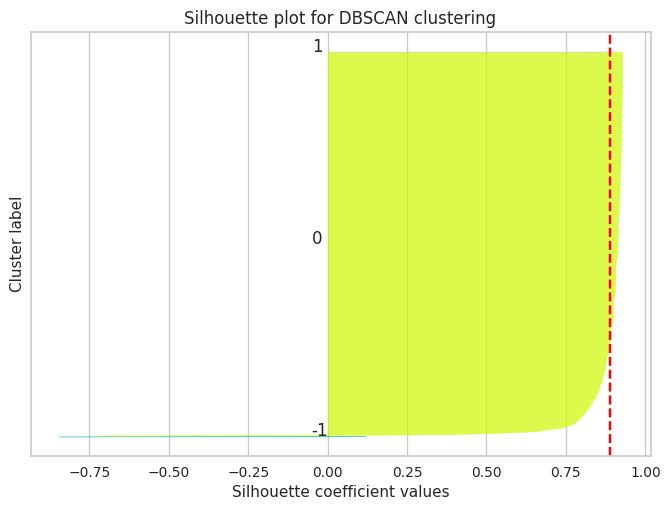

In [33]:
# Fit DBSCAN and get labels
dbscan = DBSCAN(eps=2, min_samples=15, n_jobs=-1)
predict = dbscan.fit(scaled_features)
labels_dbscan = dbscan.labels_

# Get the number of unique clusters (excluding noise points -1)
# n_clusters_dbscan = len(np.unique(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_clusters_dbscan = len(np.unique(labels_dbscan))

# Instead of using SilhouetteVisualizer directly with DBSCAN, calculate the silhouette scores and plot them manually.
from sklearn.metrics import silhouette_samples

# Calculate silhouette scores for each sample
# silhouette_scores = silhouette_samples(scaled_features[:used_data_length], labels_dbscan)
silhouette_scores = silhouette_samples(scaled_features, labels_dbscan)

# Plot the silhouette scores
import matplotlib.cm as cm

fig, ax = plt.subplots()
y_lower = 10  # Starting position for the first cluster

for i in range(-1, n_clusters_dbscan-1):
  cluster_scores = silhouette_scores[labels_dbscan == i]
  print(f"Cluster {i}: Min={min(cluster_scores):.2f}, Avg={np.mean(cluster_scores):.2f}, Max={max(cluster_scores):.2f}")

  # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
  cluster_silhouette_scores = silhouette_scores[labels_dbscan == i]
  cluster_silhouette_scores.sort()

  # Calculate the size of the cluster
  cluster_size = cluster_silhouette_scores.shape[0]
  y_upper = y_lower + cluster_size

  # Fill the silhouette plot for cluster i
  color = cm.nipy_spectral(float(i+2) / n_clusters_dbscan)
  ax.fill_betweenx(np.arange(y_lower, y_upper),
                    0, cluster_silhouette_scores,
                    facecolor=color, edgecolor=color, alpha=0.7)

  # Label the silhouette plots with their cluster numbers at the middle
  ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))

  # Compute the new y_lower for next plot
  y_lower = y_upper + 10  # 10 for the 0 samples

ax.set_title("Silhouette plot for DBSCAN clustering")
ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax.axvline(x=np.mean(silhouette_scores), color="red", linestyle="--")

ax.set_yticks([])  # Clear the yaxis labels / ticks
# ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

In [34]:
display(np.unique(labels_dbscan, return_counts=True))
silhouette_score(scaled_features, labels_dbscan)

(array([-1,  0,  1]), array([   49, 23924,    15]))

np.float64(0.8883913099110776)

In [35]:
final_clust = scaler.inverse_transform(scaled_features)
final_clust = pd.DataFrame(final_clust, columns=columns)

final_clust['Cluster'] = labels_dbscan
display(final_clust.head())

,Age,AccBalance,TotalAmount,Cluster
0,27.0,46323.42,1000.00,0
1,31.0,25837.93,2550.00,0
2,25.0,14586.30,0.10,0
3,46.0,196643.98,36000.00,0
4,28.0,17552.17,1239.52,0


### Visualisasi

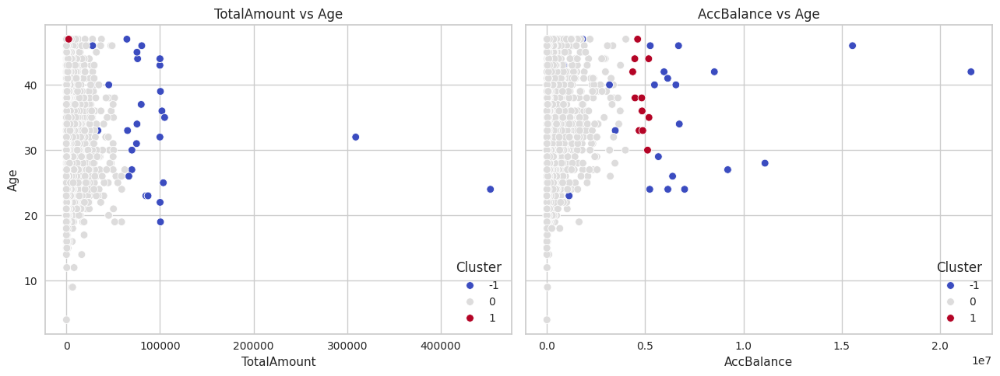

In [36]:
# Create a figure and two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(13, 5), sharey=True)  # sharey=True keeps the Y-axis consistent

# Scatterplot 1: TotalAmount vs Age
sns.scatterplot(data=final_clust, x='TotalAmount', y='Age', hue='Cluster', palette='coolwarm', ax=axes[0])
axes[0].set_title('TotalAmount vs Age')
axes[0].set_xlabel('TotalAmount')
axes[0].set_ylabel('Age')
axes[0].legend(title='Cluster', loc='lower right')

# Scatterplot 2: AccBalance vs Age
sns.scatterplot(data=final_clust, x='AccBalance', y='Age', hue='Cluster', palette='coolwarm', ax=axes[1])
axes[1].set_title('AccBalance vs Age')
axes[1].set_xlabel('AccBalance')
axes[1].set_ylabel('')
axes[1].legend(title='Cluster', loc='lower right')

# Adjust layout to avoid overlapping
plt.tight_layout()

# Display the plots
plt.show()

In [37]:
# visualisasikan cluster pada scatter 3D
fig = px.scatter_3d(final_clust, x='TotalAmount', y='AccBalance', z='Age', color='Cluster')
fig.show()

<Axes: xlabel='Cluster', ylabel='Age'>

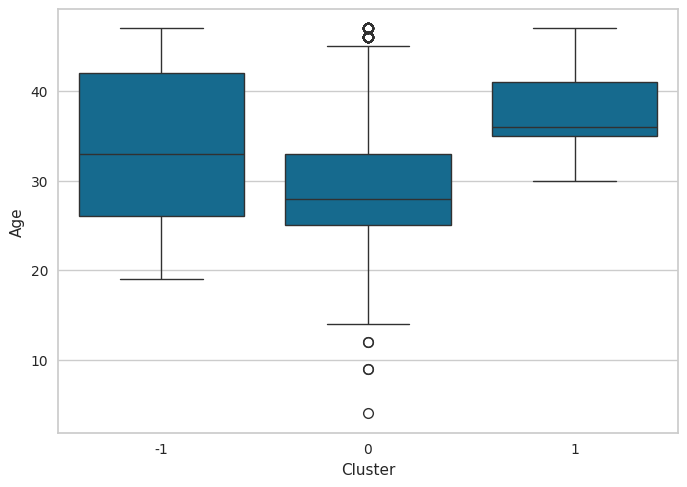

In [38]:
# mengecek distribusi Umur dari tiap cluster
sns.boxplot(data = final_clust, x = 'Cluster', y = 'Age')

<Axes: xlabel='Cluster', ylabel='AccBalance'>

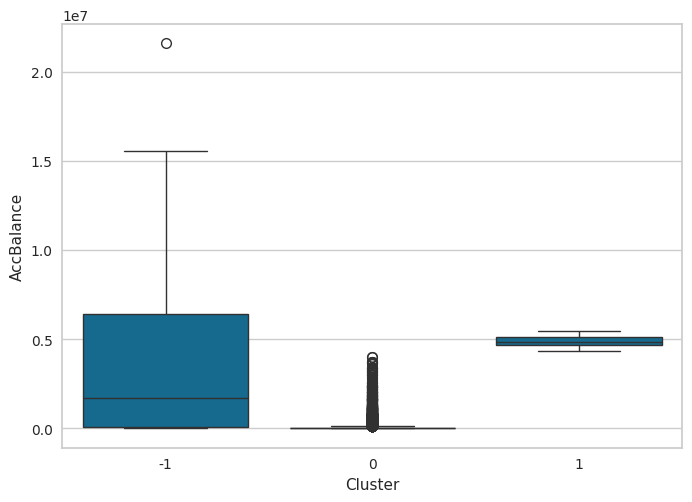

In [39]:
# mengecek distribusi Saldo Nasabah dari tiap cluster
sns.boxplot(data = final_clust, x = 'Cluster', y = 'AccBalance')

<Axes: xlabel='Cluster', ylabel='TotalAmount'>

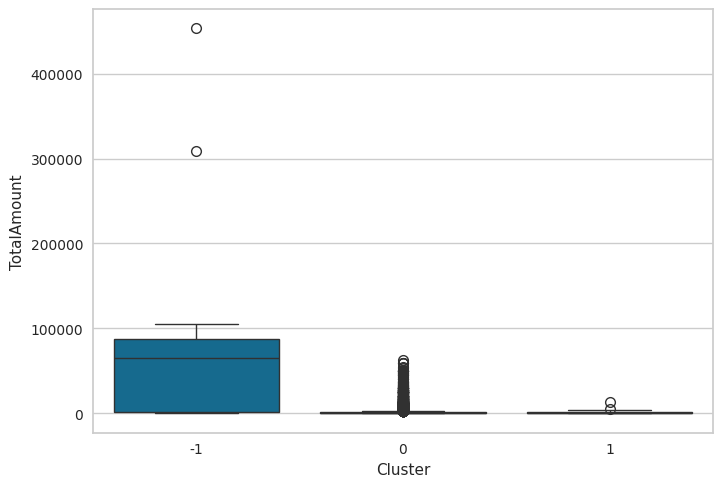

In [40]:
# mengecek distribusi Total Transaksi dari tiap cluster
sns.boxplot(data = final_clust, x = 'Cluster', y = 'TotalAmount')

### Remodelling dengan PCA

In [41]:
from sklearn.decomposition import PCA

# mendefinisikan PCA
pca_ = PCA()

# lakukan transformasi pada transaction_summary hasil scaling
scaler = StandardScaler()

# Select only numeric features and exclude the 'CustomerID' column
numeric_features = transaction_summary.select_dtypes(include=np.number).drop(columns=['CustomerID'], errors='ignore')

# Fit and transform the scaler on the selected numeric features
scaled_processed_data = scaler.fit_transform(numeric_features.sample(frac = 0.03, random_state = 1000))

# Continue with the PCA transformation
pca_transformed_data = pca_.fit_transform(scaled_processed_data)

# cek explained ratio
pca_.explained_variance_ratio_

array([0.27812003, 0.17006783, 0.14529659, 0.13391964, 0.12229592,
       0.12118767, 0.02911232])

In [42]:
all_columns = transaction_summary.columns

# membuat objek dataframe dari hasil PCA
pca_columns = []

# get index and value with enumerate
for i, col in enumerate(numeric_features.columns):
  pca_columns.append(f"PC{str(i+1)}")

pca_transform_df = pd.DataFrame(pca_transformed_data, columns=pca_columns)
display(pca_transform_df.head())

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,-0.051341,-0.712871,-1.132465,-1.185555,-1.162274,0.186361,-0.065502
1,2.784564,-0.427707,-1.016035,-1.188769,-0.826772,0.720228,-0.699535
2,0.080928,-0.559668,0.897008,-0.408618,-1.662646,-0.483286,-0.108668
3,0.262110,3.805797,-4.377036,3.231085,-1.427633,1.499762,0.289705
4,2.981252,-0.392989,0.605605,0.496290,1.209634,-0.163162,0.524288


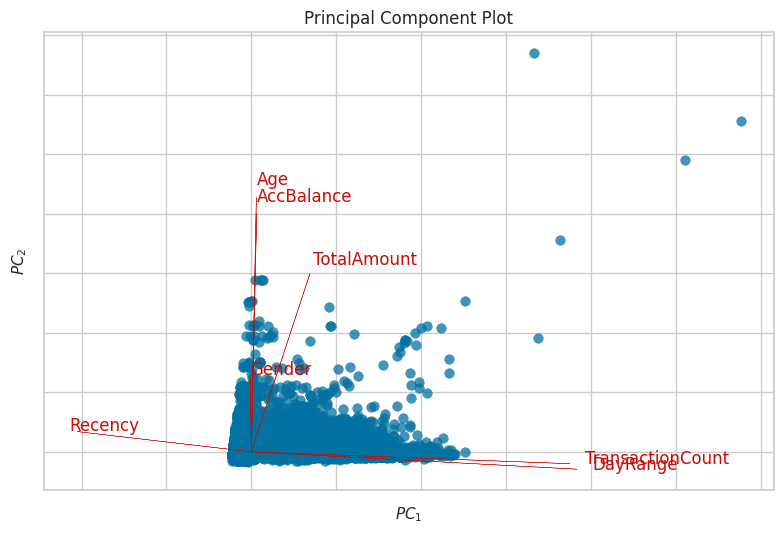

<Axes: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [43]:
from yellowbrick.features import PCA as pca_viz

# proyeksikan data menggunakan pca_viz
visualizer = pca_viz(scale=True, proj_features=True)
visualizer.fit_transform(transaction_summary[numeric_features.columns])
visualizer.show()

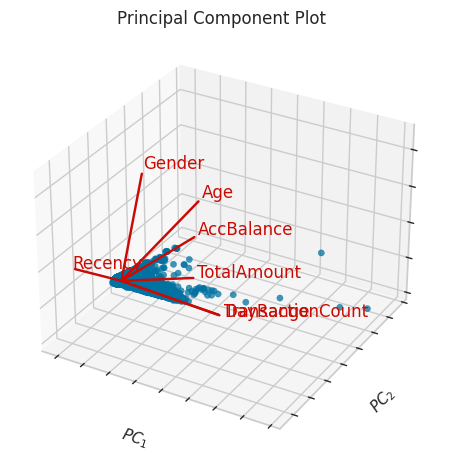

<Axes3D: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$', zlabel='$PC_3$'>

In [44]:
# proyeksikan data menggunakan pca_viz secara 3d
visualizer = pca_viz(scale=True, proj_features=True, projection=3)
visualizer.fit_transform(transaction_summary[numeric_features.columns])
visualizer.show()

In [45]:
# visualisasikan scatter 3D menggunakan data pca_transform_df
fig = px.scatter_3d(pca_transform_df, x='PC1', y='PC2', z='PC3')
fig.show()

### 3 Features

Cluster -1: Min=-0.40, Avg=0.18, Max=0.36
Cluster 0: Min=-0.17, Avg=0.85, Max=0.90
0.8600703341656756


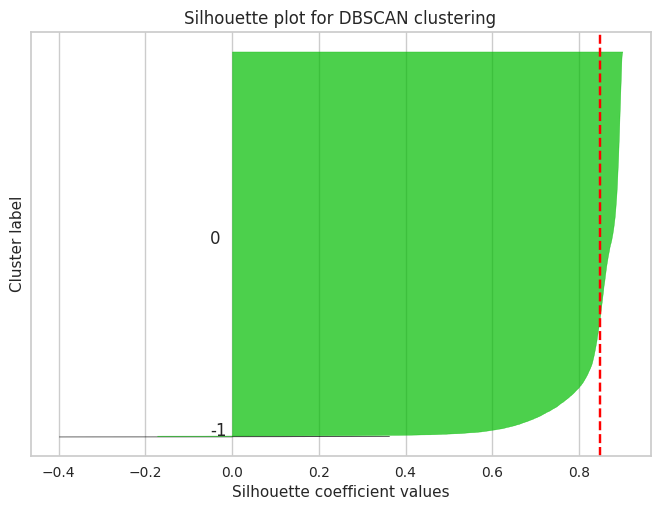

In [52]:
# Remodelling with PCA features

pca_transform_data = pca_transform_df.iloc[:, :3]

# Fit DBSCAN and get labels
dbscan_pca = DBSCAN(eps=2, min_samples=15, n_jobs=-1)
dbscan_pca.fit(pca_transform_data)
labels_dbscan_pca = dbscan_pca.labels_

# Get the number of unique clusters (excluding noise points -1)
# n_clusters_dbscan = len(np.unique(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_clusters_dbscan_pca = len(np.unique(labels_dbscan_pca))

# Instead of using SilhouetteVisualizer directly with DBSCAN, calculate the silhouette scores and plot them manually.
from sklearn.metrics import silhouette_samples

# Calculate silhouette scores for each sample
silhouette_scores = silhouette_samples(pca_transform_data, labels_dbscan_pca)

# Plot the silhouette scores
import matplotlib.cm as cm

fig, ax = plt.subplots()
y_lower = 10  # Starting position for the first cluster

for i in range(-1, n_clusters_dbscan_pca-1):
  cluster_scores = silhouette_scores[labels_dbscan_pca == i]
  print(f"Cluster {i}: Min={min(cluster_scores):.2f}, Avg={np.mean(cluster_scores):.2f}, Max={max(cluster_scores):.2f}")

  # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
  cluster_silhouette_scores = silhouette_scores[labels_dbscan_pca == i]
  cluster_silhouette_scores.sort()

  # Calculate the size of the cluster
  cluster_size = cluster_silhouette_scores.shape[0]
  y_upper = y_lower + cluster_size

  # Fill the silhouette plot for cluster i
  color = cm.nipy_spectral(float(i+1) / n_clusters_dbscan_pca)
  ax.fill_betweenx(np.arange(y_lower, y_upper),
                    0, cluster_silhouette_scores,
                    facecolor=color, edgecolor=color, alpha=0.7)

  # Label the silhouette plots with their cluster numbers at the middle
  ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))

  # Compute the new y_lower for next plot
  y_lower = y_upper + 10  # 10 for the 0 samples

print(silhouette_score(pca_transformed_data, labels_dbscan_pca))

ax.set_title("Silhouette plot for DBSCAN clustering")
ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax.axvline(x=np.mean(silhouette_scores), color="red", linestyle="--")

ax.set_yticks([])  # Clear the yaxis labels / ticks
# ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

In [47]:
# final_clust_pca = pca_.inverse_transform(pca_transformed_data)
# final_clust_pca = scaler.inverse_transform(final_clust_pca)
# final_clust_pca = pd.DataFrame(final_clust_pca).iloc[:, :3]
# column_names = numeric_features.columns
# final_clust_pca.columns = column_names[:3]
final_clust_pca = pd.DataFrame(pca_transform_data)
column_names = ['TransactionCount', 'AccBalance', 'Age']
final_clust_pca.columns = column_names

final_clust_pca['Cluster'] = labels_dbscan_pca
display(final_clust_pca.sample(frac=1).head())

,TransactionCount,AccBalance,Age,Cluster
13071,-0.804399,0.387399,-1.267169,0
9800,-0.841378,-0.083689,0.472424,0
19913,0.031727,0.863550,0.968701,0
10993,-0.655716,-1.529431,-1.455531,0
18489,-0.709968,-0.097830,0.448028,0


In [48]:
# visualisasikan cluster pada scatter 3D
fig = px.scatter_3d(final_clust_pca, x=column_names[0], y=column_names[1], z=column_names[2], color='Cluster')
fig.show()

### 2 Features

Cluster -1: Min=-0.25, Avg=0.27, Max=0.47
Cluster 0: Min=-0.34, Avg=0.89, Max=0.93
0.8870951717544534


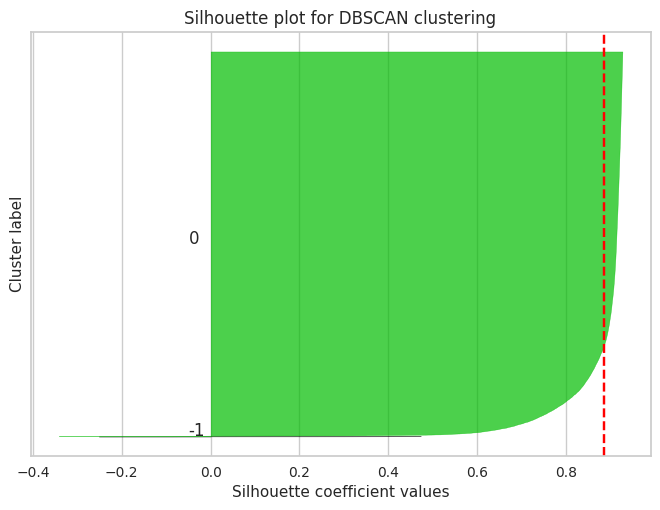

In [53]:
# Remodelling with PCA features

pca_transform_data = pca_transform_df.iloc[:, :2]

# Fit DBSCAN and get labels
dbscan_pca = DBSCAN(eps=2, min_samples=15, n_jobs=-1)
dbscan_pca.fit(pca_transform_data)
labels_dbscan_pca = dbscan_pca.labels_

# Get the number of unique clusters (excluding noise points -1)
# n_clusters_dbscan = len(np.unique(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_clusters_dbscan_pca = len(np.unique(labels_dbscan_pca))

# Instead of using SilhouetteVisualizer directly with DBSCAN, calculate the silhouette scores and plot them manually.
from sklearn.metrics import silhouette_samples

# Calculate silhouette scores for each sample
silhouette_scores = silhouette_samples(pca_transform_data, labels_dbscan_pca)

# Plot the silhouette scores
import matplotlib.cm as cm

fig, ax = plt.subplots()
y_lower = 10  # Starting position for the first cluster

for i in range(-1, n_clusters_dbscan_pca-1):
  cluster_scores = silhouette_scores[labels_dbscan_pca == i]
  print(f"Cluster {i}: Min={min(cluster_scores):.2f}, Avg={np.mean(cluster_scores):.2f}, Max={max(cluster_scores):.2f}")

  # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
  cluster_silhouette_scores = silhouette_scores[labels_dbscan_pca == i]
  cluster_silhouette_scores.sort()

  # Calculate the size of the cluster
  cluster_size = cluster_silhouette_scores.shape[0]
  y_upper = y_lower + cluster_size

  # Fill the silhouette plot for cluster i
  color = cm.nipy_spectral(float(i+1) / n_clusters_dbscan_pca)
  ax.fill_betweenx(np.arange(y_lower, y_upper),
                    0, cluster_silhouette_scores,
                    facecolor=color, edgecolor=color, alpha=0.7)

  # Label the silhouette plots with their cluster numbers at the middle
  ax.text(-0.05, y_lower + 0.5 * cluster_size, str(i))

  # Compute the new y_lower for next plot
  y_lower = y_upper + 10  # 10 for the 0 samples

print(silhouette_score(pca_transformed_data, labels_dbscan_pca))

ax.set_title("Silhouette plot for DBSCAN clustering")
ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax.axvline(x=np.mean(silhouette_scores), color="red", linestyle="--")

ax.set_yticks([])  # Clear the yaxis labels / ticks
# ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

In [50]:
# final_clust_pca = pca_.inverse_transform(pca_transformed_data)
# final_clust_pca = scaler.inverse_transform(final_clust_pca)
# final_clust_pca = pd.DataFrame(final_clust_pca).iloc[:, :2]
# column_names = numeric_features.columns
# final_clust_pca.columns = column_names[:2]
final_clust_pca = pd.DataFrame(pca_transform_data)
column_names = ['TransactionCount', 'AccBalance']
final_clust_pca.columns = column_names

final_clust_pca['Cluster'] = labels_dbscan_pca
display(final_clust_pca.sample(frac=1).head())

,TransactionCount,AccBalance,Cluster
2381,-0.130151,0.025324,0
18959,-0.606815,-0.515181,0
20614,-0.492053,0.666926,0
18149,-1.018688,0.750335,0
15567,-0.435034,-0.197603,0


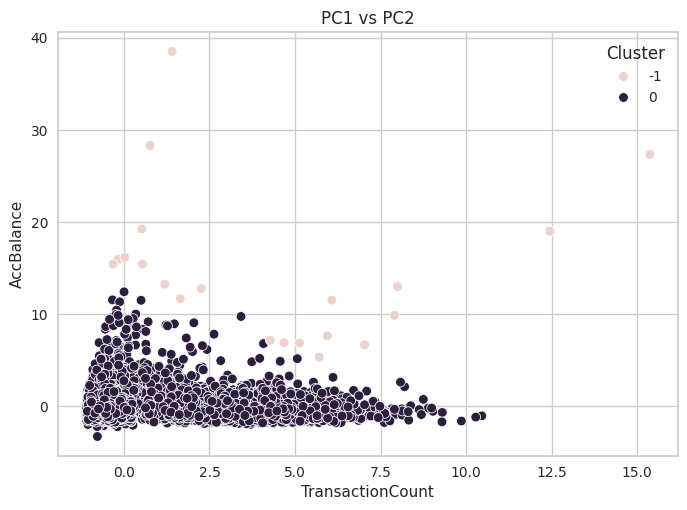

In [51]:
# visualisasikan PC1 dan PC2
sns.scatterplot(data = final_clust_pca, x=column_names[0], y=column_names[1], hue = "Cluster")
plt.title("PC1 vs PC2")
plt.show()